In [ ]:
import librosa
import librosa.display
import IPython.display as ipd
import matplotlib.pyplot as plt


In [ ]:
AJ_file = "AJ.mp3"
Bail_file = "Bail.mp3"
jailer_file = "jailer.mp3"


In [ ]:
ipd.Audio(AJ_file )

In [ ]:
ipd.Audio(Bail_file)

In [ ]:
ipd.Audio(jailer_file)

In [ ]:
AJ, sr = librosa.load(AJ_file)
Bail, _ = librosa.load(Bail_file)
jailer, _ = librosa.load(jailer_file)

In [ ]:
AJ

array([ 3.5527137e-14,  0.0000000e+00, -1.4210855e-14, ...,
        5.5451119e-07,  1.3846420e-07,  3.0618867e-07], dtype=float32)

In [ ]:

AJ.shape

(3051072,)

Duration of 1 Sample:

sample_duration = 1/sr

Default Value of Sampling Rate assumed by Librosa is : 22050






In [ ]:
sr

22050

In [ ]:
sampling_duration = 1/sr

print(f"the sampling duration of 1 sample is: {sampling_duration:.6f} seconds")

the sampling duration of 1 sample is: 0.000045 seconds


In [ ]:
AJ_duration = sampling_duration * len(AJ)

In [ ]:
AJ_duration

138.37061224489796

(-2.0, 2.0)

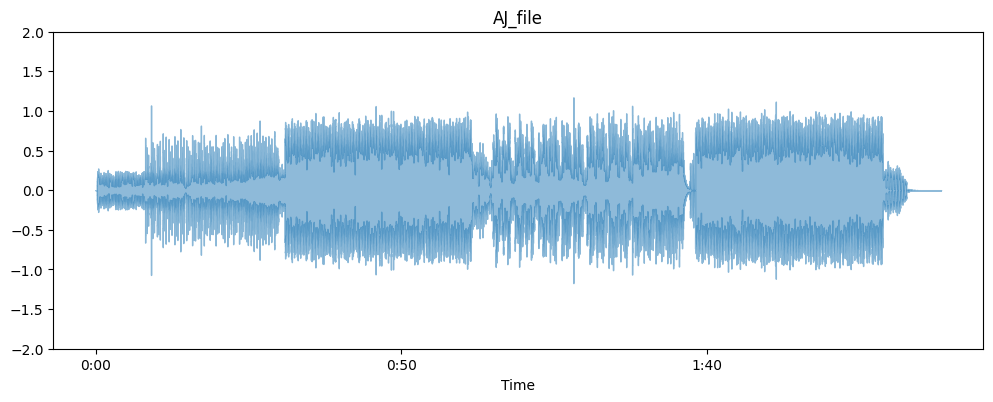

In [ ]:
plt.figure(figsize = (12,14))
plt.subplot(3,1,1)
librosa.display.waveshow(AJ,alpha = 0.5)
plt.title("AJ_file")
plt.ylim((-2,2))

(-2.0, 2.0)

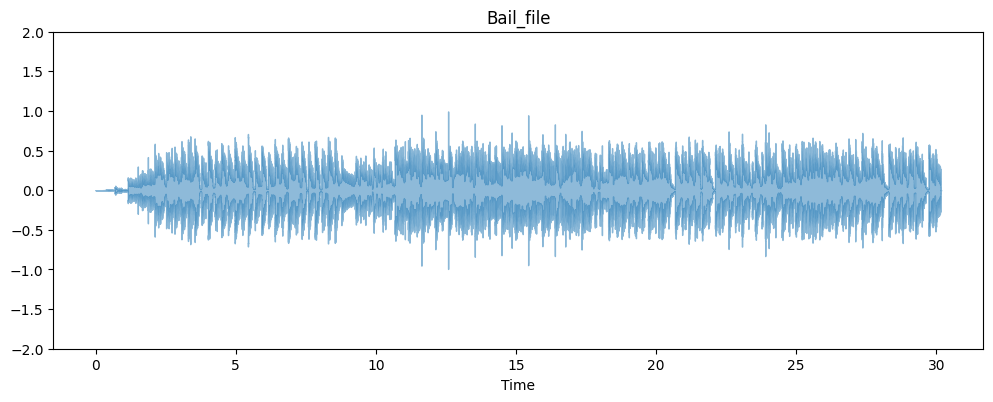

In [ ]:
plt.figure(figsize = (12,14))
plt.subplot(3,1,2)
librosa.display.waveshow(Bail,alpha = 0.5)
plt.title("Bail_file")
plt.ylim((-2,2))

(-2.0, 2.0)

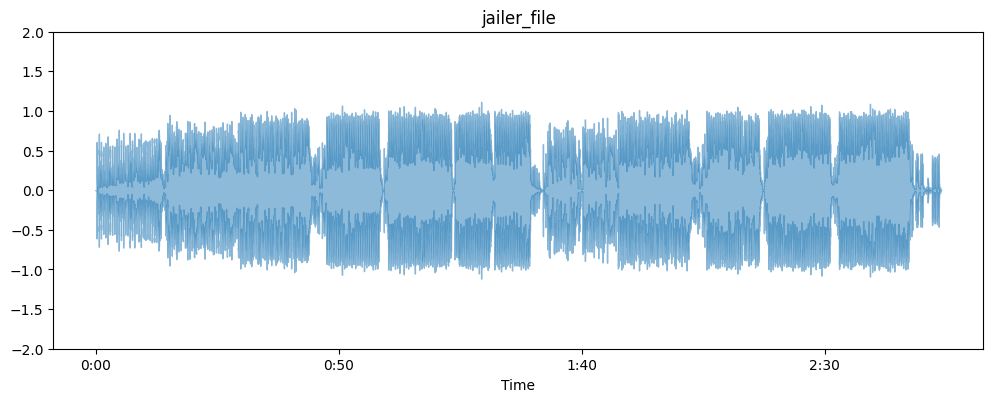

In [ ]:
plt.figure(figsize = (12,14))
plt.subplot(3,1,3)
librosa.display.waveshow(jailer,alpha = 0.5)
plt.title("jailer_file")
plt.ylim((-2,2))

Calculating the Ampitude Envelope

In [ ]:
import numpy as np

In [ ]:
len(AJ) == AJ.size

True

In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

def ampl_env(signal,frame_size = FRAME_SIZE,hop_length=HOP_LENGTH):
  amp_envelope = []
  for i in range(0,len(signal),hop_length):
    current_frame_amp_env = max(signal[i:i+frame_size])
    amp_envelope.append(current_frame_amp_env)
  return np.array(amp_envelope)


# """SAME CODE AS ABOVE BUT USING LIST COMPREHENSION"""
# FRAME_SIZE = 1024
# HOP_LENGTH = 512

# def list_comp_ae(signal,frame_size = FRAME_SIZE,hop_length = HOP_LENGTH):
#   return np.array([max(signal[i:i+frame_size]) for i in range(0,len(signal),hop_length)])

# ae_list_comp = list_comp_ae(AJ,FRAME_SIZE,HOP_LENGTH)
# len(ae_list_comp)


In [ ]:
ae_AJ = ampl_env((AJ),FRAME_SIZE)
ae_Bail = ampl_env((Bail),FRAME_SIZE)
ae_Jailer = ampl_env((jailer),FRAME_SIZE)

In [ ]:
print(ae_AJ.size)
print(ae_Bail.size)
print(ae_Jailer.size)

5960
1300
7492


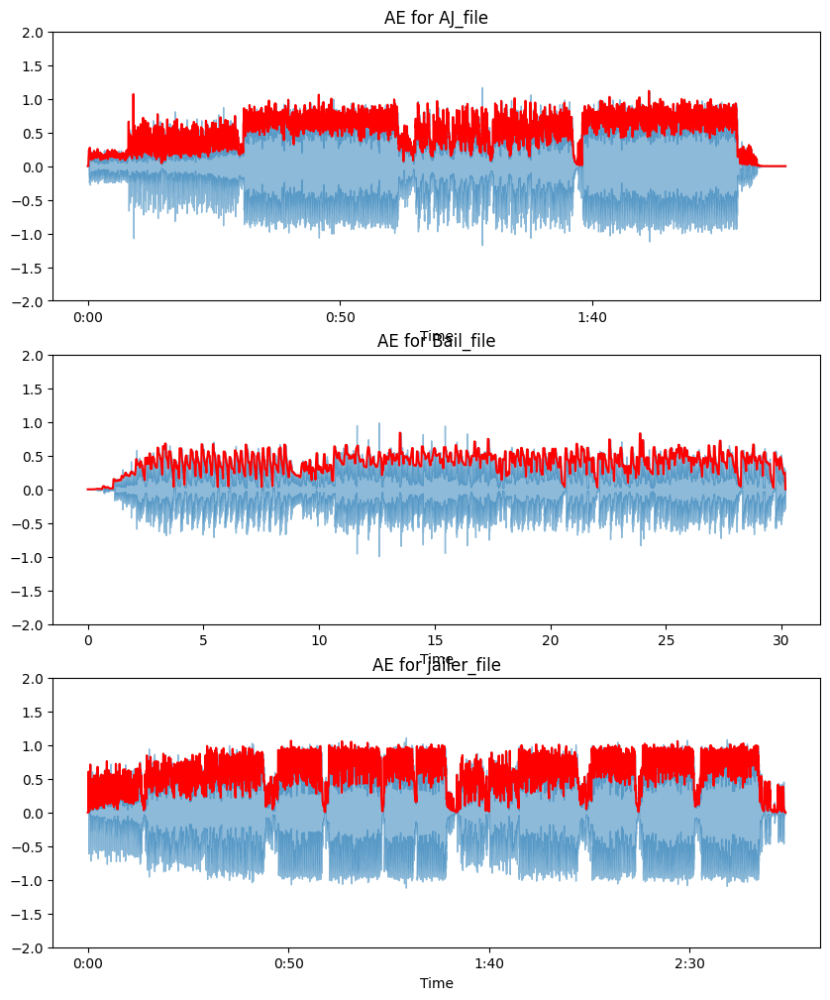

In [ ]:
frame1 = range(0,len(ae_AJ))
frame2 = range(0,len(ae_Bail))
frame3 = range(0,len(ae_Jailer))


t1 = librosa.frames_to_time(frame1,hop_length = HOP_LENGTH)
t2 = librosa.frames_to_time(frame2,hop_length = HOP_LENGTH)
t3 = librosa.frames_to_time(frame3,hop_length = HOP_LENGTH)

plt.figure(figsize = (10,12))

plt.subplot(3,1,1)
librosa.display.waveshow(AJ,alpha = 0.5)
plt.plot(t1,ae_AJ,color = 'r')
plt.title("AE for AJ_file")
plt.ylim((-2,2))


plt.subplot(3,1,2)
librosa.display.waveshow(Bail,alpha = 0.5)
plt.plot(t2,ae_Bail,color = 'r')
plt.title("AE for Bail_file")
plt.ylim((-2,2))


plt.subplot(3,1,3)
librosa.display.waveshow(jailer,alpha = 0.5)
plt.plot(t3,ae_Jailer,color = 'r')
plt.title("AE for jailer_file")
plt.ylim((-2,2))

plt.show()